In [1]:
import skimage
from skimage import io as sio
import numpy as np
from matplotlib import pyplot as plt
from pprint import pprint
%matplotlib inline

In [2]:
def grad(img):
    Y = 0.299 * img[:, :, 0] + 0.587 * img[:, :, 1] + 0.114 * img[:, :, 2]
    w, h = img.shape[0], img.shape[1]
    
    Yw = np.zeros((w, h)).astype(np.float64)
    Yw[:, 1:h - 1] = Y[:, 2:] - Y[:, 0:h - 2]
    Yw[:, 0] = Y[:, 1] - Y[:, 0]
    Yw[:, h - 1] = Y[:, h - 1] - Y[:, h - 2]
    
    Yh = np.zeros((w, h)).astype(np.float64)
    Yh[1:w - 1, :] = Y[2:, :] - Y[0:w - 2, :]
    Yh[0, :] = Y[1, :] - Y[0, :]
    Yh[w - 1, :] = Y[w - 1, :] - Y[w - 2, :]
    
    return (Yw * Yw + Yh * Yh) ** 0.5

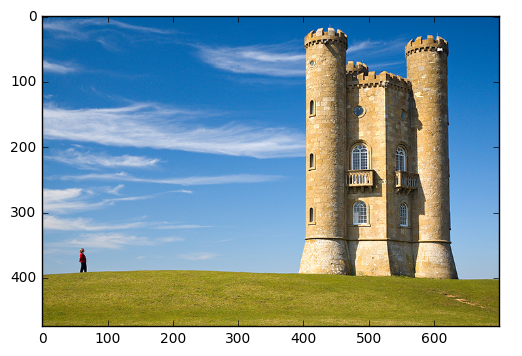

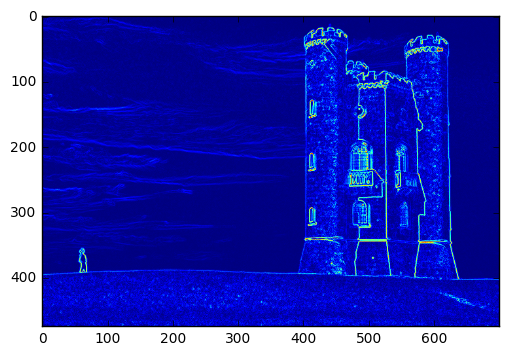

In [3]:
img = sio.imread("./tests/pic_01.png")
plt.imshow(img)
plt.show()

grad_img = grad(img)
plt.imshow(grad_img)
plt.show()

In [14]:
def is_inside(x, y, w, h):
    return x >= 0 and y >= 0 and x < w and y < h


def seam_vertical_dijk(energy):
    w = energy.shape[0]
    h = energy.shape[1]
    dijk = energy.copy()
    dijk_dirs = {}
    for x in range(w):
        for y in range(h):
            dijk[x][y] =  dijk[x - 1][y]
            dijk_dirs[(x, y)] = (x - 1, y) 
            for delta in [1, 0, -1]:
                if is_inside(x - 1, y + delta, w, h):
                    if dijk[x - 1][y + delta] <= dijk[x][y]:
                        dijk[x][y] = dijk[x - 1][y + delta]
                        dijk_dirs[(x, y)] = (x - 1, y + delta)
            dijk[x][y] += energy[x][y]
    return dijk, dijk_dirs


def get_vertical_seam(lens, dirs):
    w = lens.shape[0]
    h = lens.shape[1]
    opt_x, opt_y = w - 1, 0
    opt_value = lens[opt_x, opt_y]
    for y in range(h):
        if lens[opt_x, y] < opt_value:
            opt_y = y
            opt_value = lens[opt_x, opt_y]
    path = [(opt_x, opt_y)]
    x, y = opt_x, opt_y
    while x > 0:
        x, y = dirs[(x, y)]
        path.append((x, y))

    seam_mask = np.zeros(lens.shape)
    for point in path:
        seam_mask[point] = 1
        
    return list(reversed(path)), seam_mask

    
def seam_transpose(path):
    trans_path = []
    for point in path:
        trans_path.append([point[1], point[0]])
    return trans_path


def img_del_vertical_seam(img, seam):
    w = img.shape[0]
    h = img.shape[1]
    if len(img.shape) == 2:
        new_img = np.zeros((w, h - 1)).astype(np.uint8)
    else:
        new_img = np.zeros((w, h - 1, 3)).astype(np.uint8)
    for point in seam:
        x, y = point[0], point[1]
        new_img[x, :] = np.concatenate([img[x, :y], img[x, y + 1:]])
        
    return new_img
 
def get_next_am(img, x, y):
    # return img[x][y]
    w, h = img.shape[0], img.shape[1]
    if is_inside(x, y + 1, w, h):
        # print( (img[x][y] + img[x][y + 1]) // 2)
        return (img[x][y]/2 + img[x][y + 1]/2).astype(np.uint8)
    else:
        return img[x][y]
    
    
def img_add_vertical_seam(img, seam):
    w = img.shape[0]
    h = img.shape[1]
    if len(img.shape) == 2:
        new_img = np.zeros((w, h + 1)).astype(np.float)
    else:
        new_img = np.zeros((w, h + 1, 3)).astype(np.uint8)
    for point in seam:
        x, y = point[0], point[1]
        if len(img.shape) == 2:
            new_img[x, :] = np.concatenate(
            [img[x, :y + 1],
             np.array([0]),
             img[x, y + 1:]])
            new_img[x, y] += 1.0
            new_img[x, y + 1] += 1.0
        else:
            new_img[x, :] = np.concatenate(
                [img[x, :y + 1], 
                np.array([get_next_am(img, x, y)]), 
                img[x, y + 1:]])

    return new_img



In [15]:
def seam_carve(img, mode, mask=None):
    energy = grad(img)
    if mask is not None:
        energy += 256 * img.shape[0] * img.shape[1] * mask
        
    if mode == 'vertical shrink':
        transponed_energy = np.transpose(energy, axes=[1, 0])
        transponed_img = np.transpose(img, axes=[1, 0, 2])
        transponed_mask = np.transpose(mask, axes=[1, 0])
        
        lens, dirs = seam_vertical_dijk(transponed_energy)
        transponed_seam, transponed_seam_mask = get_vertical_seam(lens, dirs)
        
        new_transponed_img = img_del_vertical_seam(transponed_img, transponed_seam)
        new_img = np.transpose(new_transponed_img, axes=[1, 0, 2])
        seam = seam_transpose(transponed_seam)
        seam_mask = np.transpose(transponed_seam_mask, axes=[1, 0])
        
        if mask is not None:
            new_transponed_mask = img_del_vertical_seam(transponed_mask, seam)
        else: 
            new_mask = None
        new_mask = np.transpose(transponed_mask, axes=[1, 0])
        return new_img, new_mask, seam_mask
    
    if mode == 'horizontal shrink':
        lens, dirs = seam_vertical_dijk(energy)
        seam, seam_mask = get_vertical_seam(lens, dirs)
        new_img = img_del_vertical_seam(img, seam)
        if mask is not None:
            new_mask = img_del_vertical_seam(mask, seam)
        else:
            new_mask = None
        return new_img, new_mask, seam_mask
    
    if mode == 'horizontal expand':
        lens, dirs = seam_vertical_dijk(energy)
        seam, seam_mask = get_vertical_seam(lens, dirs)
        new_img = img_add_vertical_seam(img, seam)
        if mask is not None:
            new_mask = img_add_vertical_seam(mask, seam)
        else:
            new_mask = None
        return new_img, new_mask, seam_mask
    
    if mode == 'vertical expand':
        
        transponed_energy = np.transpose(energy, axes=[1, 0])
        transponed_img = np.transpose(img, axes=[1, 0, 2])
        transponed_mask = np.transpose(mask, axes=[1, 0])
        
        lens, dirs = seam_vertical_dijk(transponed_energy)
        transponed_seam, transponed_seam_mask = get_vertical_seam(lens, dirs)
        
        new_transponed_img = img_add_vertical_seam(transponed_img, transponed_seam)
        new_img = np.transpose(new_transponed_img, axes=[1, 0, 2])
        seam = seam_transpose(transponed_seam)
        seam_mask = np.transpose(transponed_seam_mask, axes=[1, 0])
        
        if mask is not None:
            new_transponed_mask = img_add_vertical_seam(transponed_mask, seam)
        else: 
            new_mask = None
        new_mask = np.transpose(transponed_mask, axes=[1, 0])
        return new_img, new_mask, seam_mask 
    
            
def msk_to_std(msk):
    new_msk = ((msk[:,:,0]!=0)*(-1) + (msk[:,:,1]!=0)).astype('int8')    
    new_msk = new_msk.astype(np.float)
    # new_msk = (1 - (new_msk - 1) / 127.)
    return new_msk 

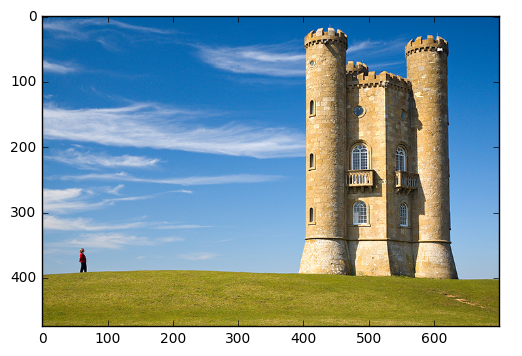

(475, 700, 3)


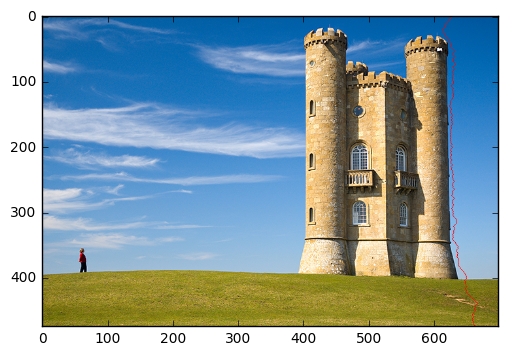

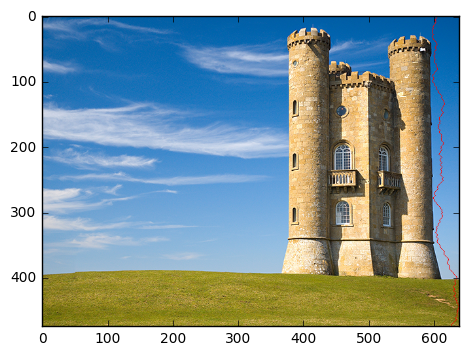

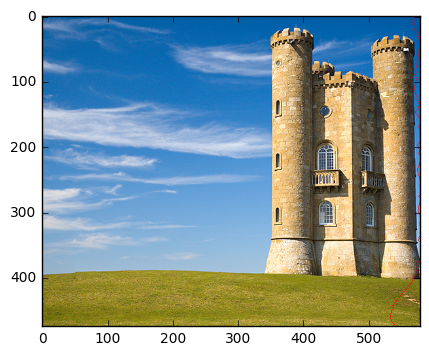

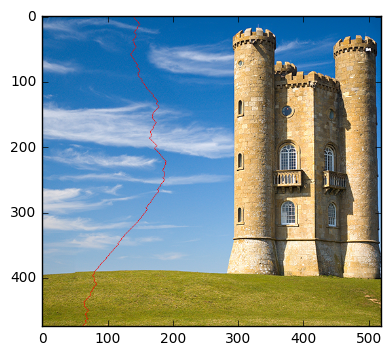

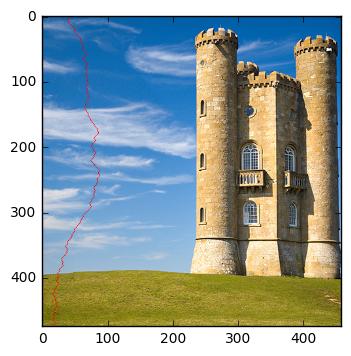

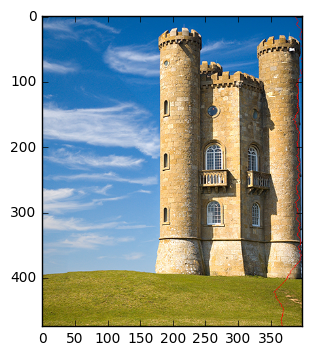

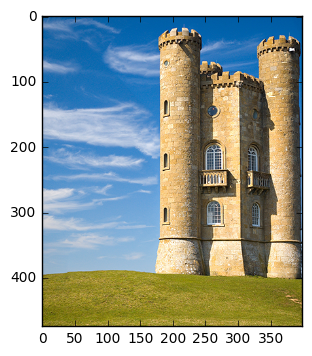

(475, 399, 3)


In [5]:
img = sio.imread("./tests/pic_01.png")
mask =  msk_to_std(sio.imread("./tests/pic_01_mask.png"))
plt.imshow(img)
plt.show()
plt.imshow(mask)
print(img.shape)

for iters in range(301):
    new_img, new_mask, seam_mask = seam_carve(img, 'horizontal shrink', mask=mask)
    if iters % 60 == 0:
        new_img_with_line = new_img.copy()
        # print(new_img_with_line)
        # print(seam_mask)
        new_img_with_line[:, :, 0] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 1] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 2] *= (1 - seam_mask[:, :new_img.shape[1]].astype(np.uint8))
        new_img_with_line[:, :, 0] += (255 * seam_mask[:, :new_img.shape[1]]).astype(np.uint8)
        plt.imshow(new_img_with_line)
        plt.show()
    img = new_img
    mask = new_mask

plt.imshow(new_img)
plt.show()
print(img.shape)

Как видим, со сжатием алгоритм справляется неплохо.

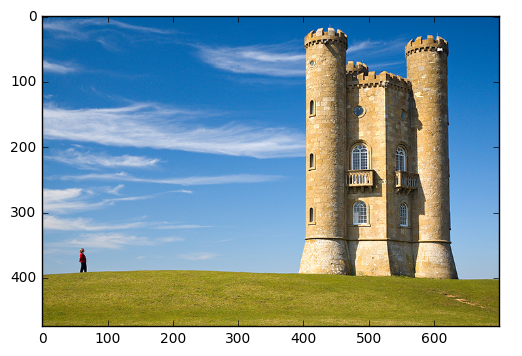

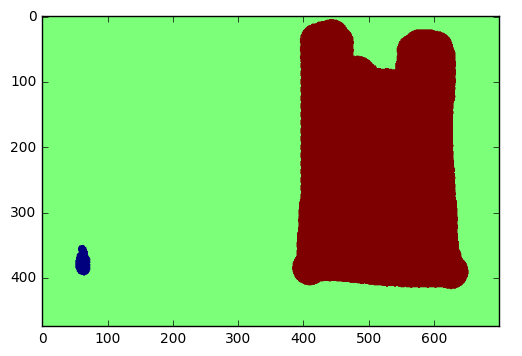

(475, 700, 3)


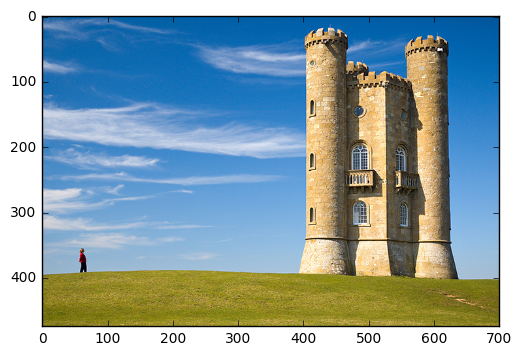

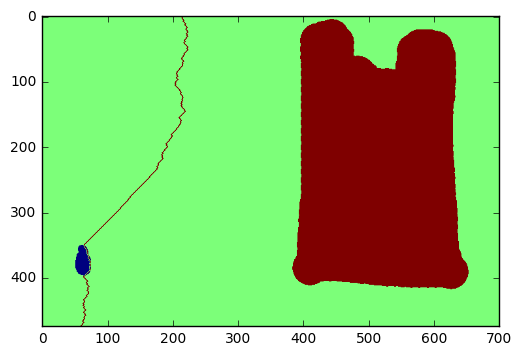

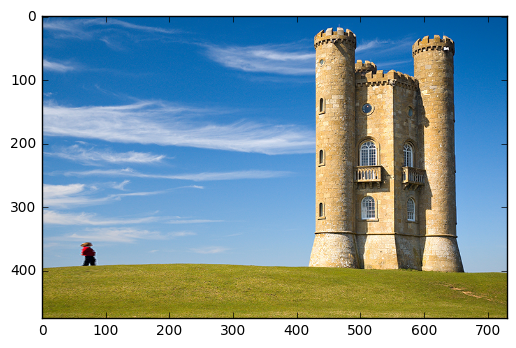

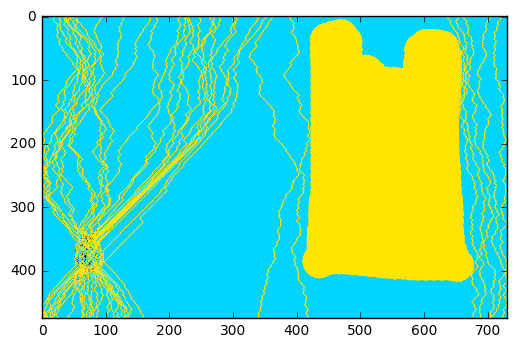

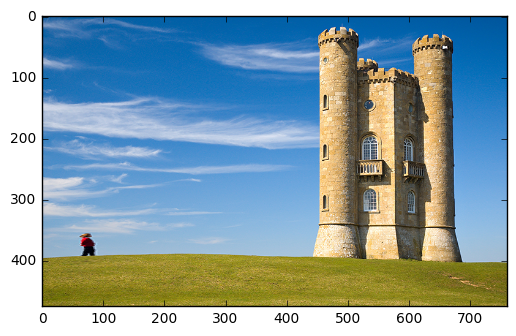

...

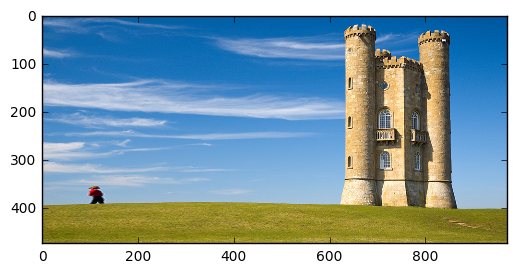

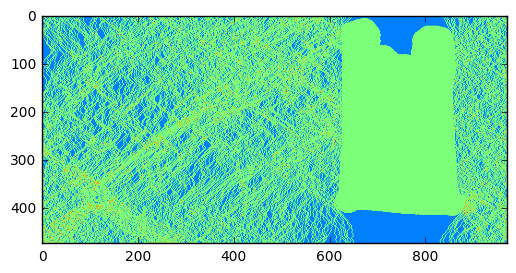

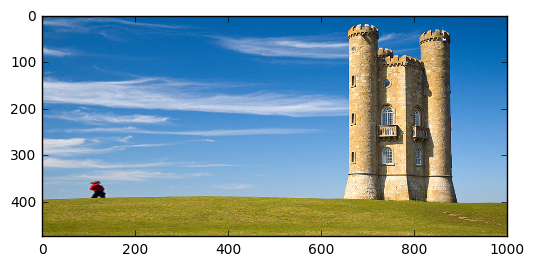

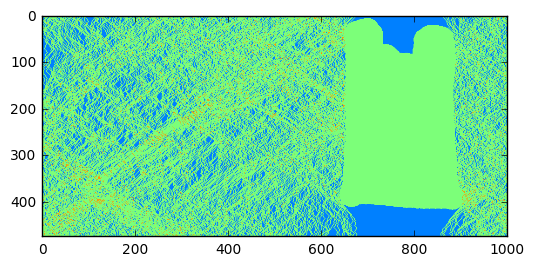

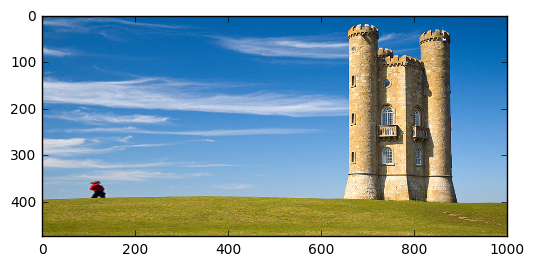

(475, 1001, 3)


In [82]:
img = sio.imread("./tests/pic_01.png")
mask =  msk_to_std(sio.imread("./tests/pic_01_mask.png"))
plt.imshow(img)
plt.show()
plt.imshow(mask)
plt.show()
# print(list(mask))
print(img.shape)

for iters in range(301):
    new_img, new_mask, seam_mask = seam_carve(img, 'horizontal expand', mask=mask)
    if iters % 100 == 0:
        plt.imshow(new_img)
        plt.show()
        plt.imshow(new_mask)
        plt.show()
        # print(list(new_mask))
        # new_img_with_line = new_img.copy()
        # print(new_img_with_line)
        # print(seam_mask)
        # new_img_with_line[:, :, 0] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 1] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 2] *= (1 - seam_mask[:, -1:new_img.shape[1]].astype(np.uint8))
        # new_img_with_line[:, :, 0] += (255 * seam_mask[:, -1:new_img.shape[1]]).astype(np.uint8)
        # plt.imshow(new_img_with_line)
        # plt.show()
    img = new_img
    mask = new_mask

plt.imshow(new_img)
plt.show()
print(img.shape)

С небольшим видоизмением алгоритма растягивает тоже неплохо (если не обращать внимание на толстого человечка)

In [6]:
!python3 ./code/seam_carve_test.py --full ./tests/

./tests/pic_03.png
./tests/pic_04.png
./tests/pic_07.png
./tests/pic_02.png
./tests/pic_06.png
./tests/pic_05.png
./tests/pic_01.png
Accuracy: 100.00%


In [7]:
 !python3 ./code/seam_carve_test.py --base ./tests/

./tests/pic_03.png
./tests/pic_04.png
./tests/pic_07.png
./tests/pic_02.png
./tests/pic_06.png
./tests/pic_05.png
./tests/pic_01.png
Accuracy: 100.00%


А теперь пробежимся по всем картинкам в директории и оценим, как хорошо они сжимаются и растягиваются. Однако, для этого мы немного адаптируем алгоритм таким образом: когда мы добавляем новый шов, то мы запрещаем разрезать не только по старому,  но и по новому, так как он зачастую очень похож на старый и изображение растягивается в одной точке на каждой итерации, что некрасиво.

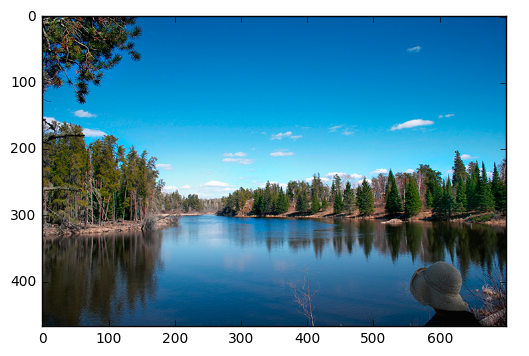

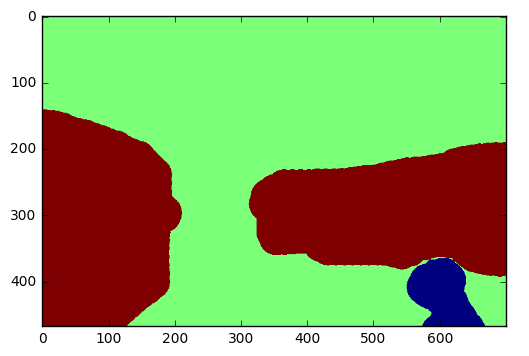

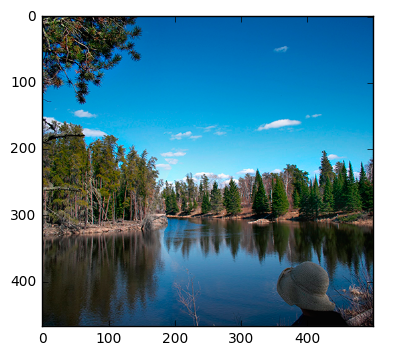

(468, 500, 3)


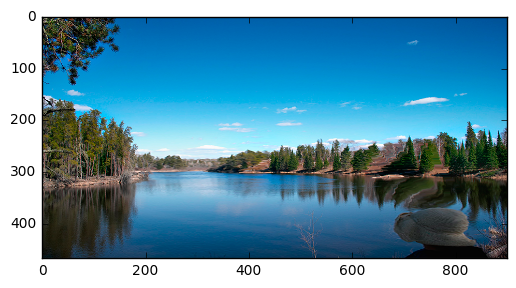

(468, 900, 3)


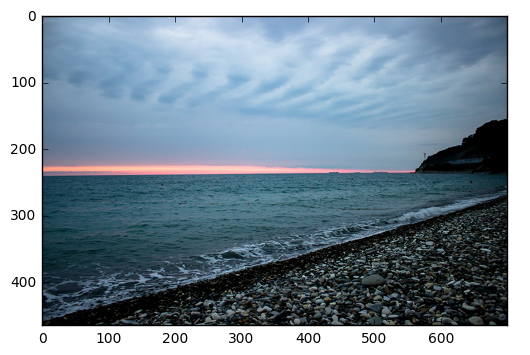

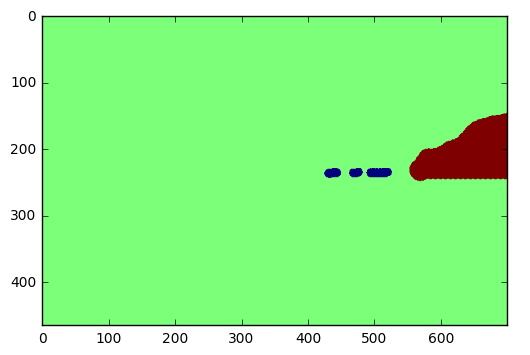

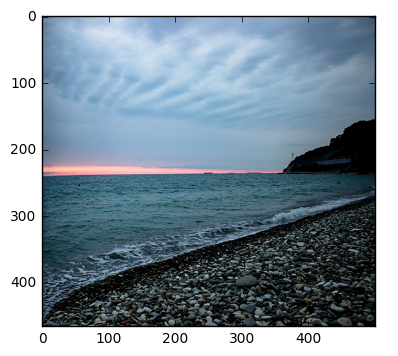

(466, 500, 3)


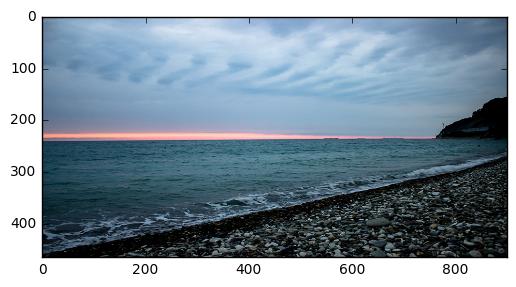

(466, 900, 3)


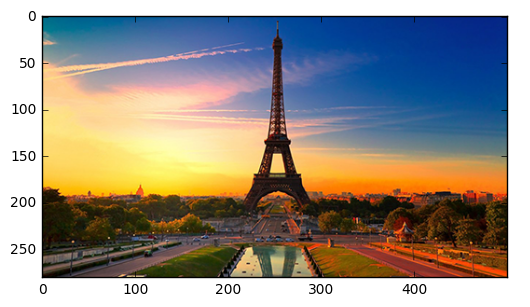

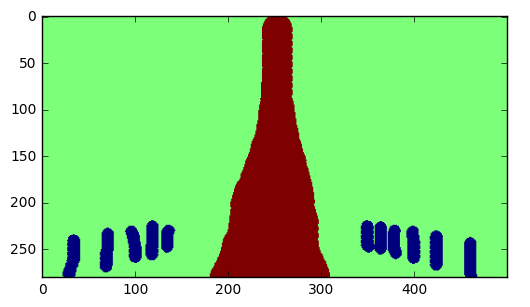

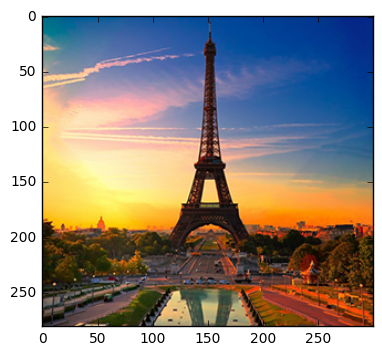

(281, 300, 3)


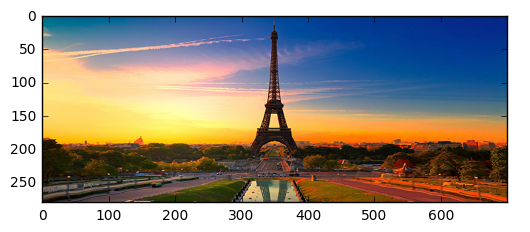

(281, 700, 3)


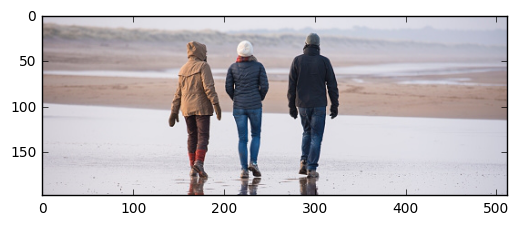

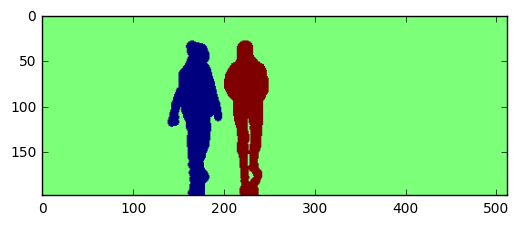

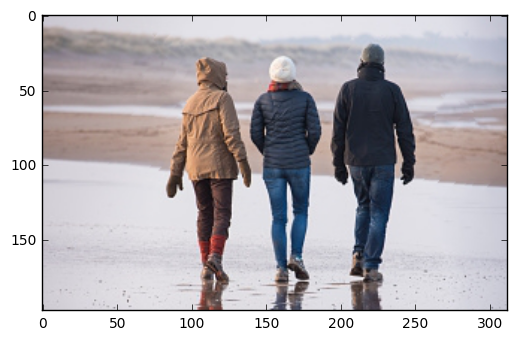

(198, 312, 3)


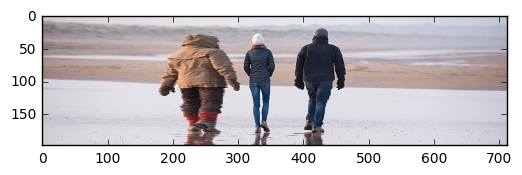

(198, 712, 3)


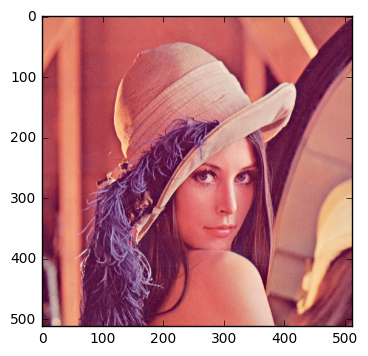

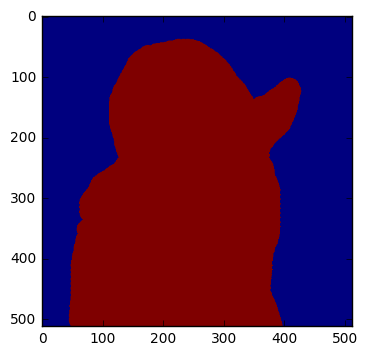

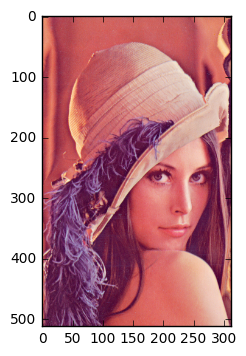

(512, 312, 3)


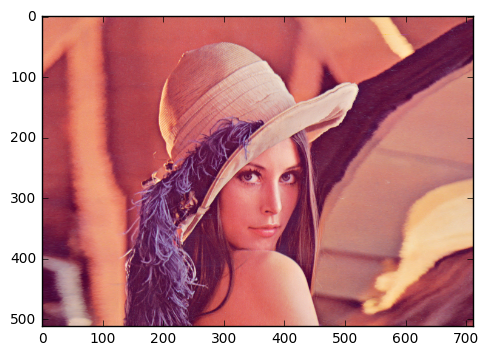

(512, 712, 3)


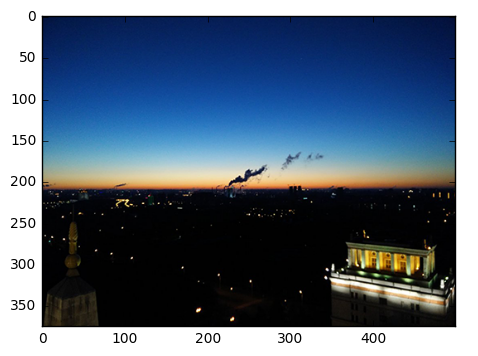

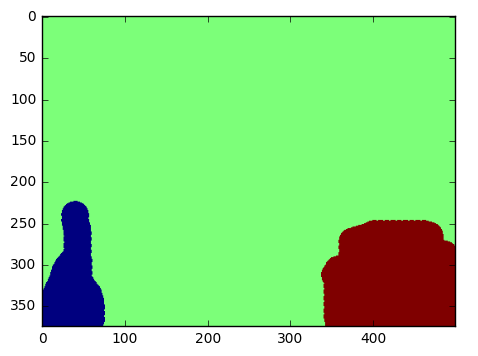

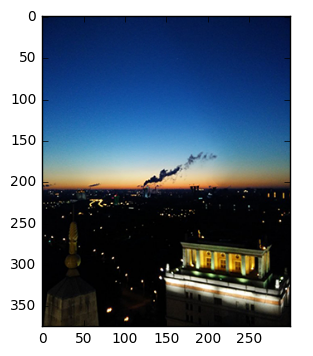

(375, 300, 3)


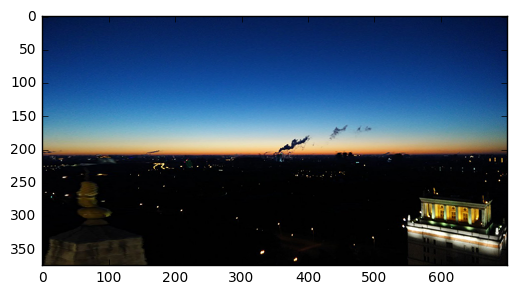

(375, 700, 3)


In [16]:
for num in ['02', '03', '04', '05', '06', '07']:
    img = sio.imread("./tests/pic_{}.png".format(num))
    mask =  msk_to_std(sio.imread("./tests/pic_{}_mask.png".format(num)))
    shrink_img = img.copy()
    shrink_mask = mask.copy()
    
    plt.imshow(shrink_img)
    plt.show()
    plt.imshow(shrink_mask)
    plt.show()
    
    for iters in range(200):
        new_img, new_mask, seam_mask = seam_carve(shrink_img, 'horizontal shrink', mask=shrink_mask)
        shrink_img = new_img
        shrink_mask = new_mask

    plt.imshow(new_img)
    plt.show()
    print(new_img.shape)
    
    expand_img = img.copy()
    expand_mask = mask.copy()
    
    for iters in range(200):
        new_img, new_mask, seam_mask = seam_carve(expand_img, 'horizontal expand', mask=expand_mask)
        expand_img = new_img
        expand_mask = new_mask

    plt.imshow(new_img)
    plt.show()
    print(new_img.shape)